<a id="top"></a> <br>
## Goal Setting

The objective of this kernel is primarily to illustrate concepts that are relevant to the forecasting of time-series data.
In particular, we touch on the topics of trends, (conditional and multiple) seasonalities, and - briefly - fourier series. 

We compare two forecasting models: Holt-Winter and Facebook's Prophet algorithms. We demonstrate how the latter allows the user to taylor the algorithm to the dataset's particular needs.

# Table of Contents
1. [Load Dataset](#1)
1. [Cleaning The Dataset](#2)
<br><span style="font-size: 10px">Deduplicating, filling missing values</span>
1. [Extracting Time Features](#3)
<br><span style="font-size: 10px"> Use as much as we can from the datetime stamp</span>
1. [EDA](#4)
<br><span style="font-size: 10px"> Analyse the distribution and correlation of variables, amongst others</span>
1. [Quick Visuals](#5)
<br><span style="font-size: 10px"> Following the light shed by the EDA, illustrate some of the data's patterns </span>
1. [Decomposing The Time-Series](#6)
<br><span style="font-size: 10px"> Gradually working our way towards forecasting models, we illustrate how time-series function can be seen as a sum of trend, seasonality, and noise</span>
1. [Forecasting Models](#7)
<br><span style="font-size: 10px"> Predicting future energy demand, presenting two models</span>
1. [Holt-Winter](#8)
<br><span style="font-size: 10px"> A somewhat naive, but remarkably powerful method</span>
1. [Prophet](#9)
<br><span style="font-size: 10px"> Our model of choice to illustrate the concept of multi- as well as conditional seasonality</span>
1. [Conclusion](#10)
<br><span style="font-size: 10px"> Summarizing insights gathered from the forecasting models, touching on avenues that could lead to further improvements</span>


### Library Imports

In [1]:
import numpy as np 

# data in/out & eda
import pandas as pd 
import pandas_profiling

# visualisations
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

<a id="1"></a> <br>
# Load Dataset

In [2]:
# let's only read one of the region's power consumptions, to keep this notebook concise
df = pd.read_csv('../input/hourly-energy-consumption/PJME_hourly.csv')

# sort by date & time
df['Datetime'] = pd.to_datetime(df['Datetime'])
df.sort_values(by=['Datetime'], axis=0, ascending=True, inplace=True)
df.reset_index(inplace=True, drop=True)

# renaming the target variable columns
df.rename(columns={'PJME_MW':'demand_in_MW'}, inplace=True)

# display the first couple of rows
df.head()

,Datetime,demand_in_MW
0,2002-01-01 01:00:00,30393.0
1,2002-01-01 02:00:00,29265.0
2,2002-01-01 03:00:00,28357.0
3,2002-01-01 04:00:00,27899.0
4,2002-01-01 05:00:00,28057.0


<a id="2"></a> <br>
# Cleaning the dataset 

## Deduplicating

In [3]:
# deduplicate, only keeping the last measurement per datetime
df.drop_duplicates(subset='Datetime', keep='last', inplace=True)

## Find and Fill Missing DateTime Instances

In [4]:
# let's see if we have a continuous dataset
df = df.set_index('Datetime')
print(f'df.index.freq is set to: {df.index.freq}')

df.index.freq is set to: None


The fact our datetime index's frequency is set to None is an indication there are some missing data points somewhere (otherwise Python could deduce it). Let's compare it to an uninterruped custom date range.

In [5]:
# custom range
date_range = pd.date_range(start=min(df.index), 
                           end=max(df.index), 
                           freq='H')

In [6]:
print(f'The difference in length between the custom date range and our dataset is {(len(date_range)-len(df))}:')
print(date_range.difference(df.index))

The difference in length between the custom date range and our dataset is 30:
DatetimeIndex(['2002-04-07 03:00:00', '2002-10-27 02:00:00',
               '2003-04-06 03:00:00', '2003-10-26 02:00:00',
               '2004-04-04 03:00:00', '2004-10-31 02:00:00',
               '2005-04-03 03:00:00', '2005-10-30 02:00:00',
               '2006-04-02 03:00:00', '2006-10-29 02:00:00',
               '2007-03-11 03:00:00', '2007-11-04 02:00:00',
               '2008-03-09 03:00:00', '2008-11-02 02:00:00',
               '2009-03-08 03:00:00', '2009-11-01 02:00:00',
               '2010-03-14 03:00:00', '2010-11-07 02:00:00',
               '2010-12-10 00:00:00', '2011-03-13 03:00:00',
               '2011-11-06 02:00:00', '2012-03-11 03:00:00',
               '2012-11-04 02:00:00', '2013-03-10 03:00:00',
               '2013-11-03 02:00:00', '2014-03-09 03:00:00',
               '2015-03-08 03:00:00', '2016-03-13 03:00:00',
               '2017-03-12 03:00:00', '2018-03-11 03:00:00'],
      

Let's reindex our dataset and then perform imputation.

In [7]:
# this will append the previously missing datetimes, and create null values in our target variable
df = df.reindex(date_range)

# we fill in the blanks with values that lie on a linear curve between existing data points
df['demand_in_MW'].interpolate(method='linear', inplace=True)

# now we have a neatly continuous datetime index
print(f'The df.index.freq is now: {df.index.freq}, indicating that we no longer have missing instances')

The df.index.freq is now: <Hour>, indicating that we no longer have missing instances


<a id="3"></a> <br>
# Extracting Time Features
We can split up the date-timestamp column into its different components.
This will allow us to find patterns for different groups.

In [8]:
# see: https://www.kaggle.com/robikscube/starter-hourly-energy-consumption
df['dow'] = df.index.dayofweek
df['doy'] = df.index.dayofyear
df['year'] = df.index.year
df['month'] = df.index.month
df['quarter'] = df.index.quarter
df['hour'] = df.index.hour
df['weekday'] = df.index.weekday_name
df['woy'] = df.index.weekofyear
df['dom'] = df.index.day # Day of Month
df['date'] = df.index.date 

# let's add the season number
df['season'] = df['month'].apply(lambda month_number: (month_number%12 + 3)//3)

<a id="4"></a> <br>
# EDA
A quick one-liner with pandas_profiling to get an overview of our dataset

In [9]:
pandas_profiling.ProfileReport(df)

The correlation matrix indicates the variables "dow" (day of week) and "hour" will be interesting to look at in the context of predicting our target variable.

<a id="5"></a> <br>
# Quick Visuals

### Plotting the energy consumption over time

In [10]:
# plotly doesn't allow us to access the index, so let's copy it into a column 
df['date_and_time'] = df.index

# plotting
fig = px.line(df,
              x='date_and_time',
              y='demand_in_MW',
              title=f'Power Demand (MW) over time [{min(df.year)} - {max(df.year)}]')
fig.update_traces(line=dict(width=0.05))
fig.update_layout(xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

We can definitely identify a seasonal pattern here. Counter-intuitively, though, no immediately apparent trend.

## Date & Time Patterns
We can use our previously extracted date and time features to see if recurring patterns emerge from aggregated data.
Take, for instance, the power demand throughout the day for each weekday:

In [11]:
# aggregated data
_ = df\
    .groupby(['hour', 'weekday'], as_index=False)\
    .agg({'demand_in_MW':'median'})

# plotting
fig = px.line(_, 
              x='hour', 
              y='demand_in_MW', 
              color='weekday', 
              title='Median Hourly Power Demand per Weekday')
fig.update_layout(xaxis_title='Hour',
                  yaxis_title='Energy Demand [MW]')
fig.show()

We can quickly tell demand for electricity is lower during the weekends, and dips a little sooner on friday afternoons.

In [12]:
# aggregated data
_ = df\
    .groupby(['hour', 'season'], as_index=False)\
    .agg({'demand_in_MW':'median'})

# plotting
fig = px.line(_,
              x='hour', 
              y='demand_in_MW', 
              color='season', 
              title='Median Hourly Power Demand per Season')
fig.update_layout(xaxis_title='Hour',
                  yaxis_title='Energy Demand [MW]')
fig.show()

Looks like those air conditioners are cranked up during summer!

<a id="6"></a> <br>
# Decomposing the Time-Series
Data points over time can be interesting in the sense that their patterns are complemented by a trend (upward or downward) and/or seasonality.
As we have established in our EDA, these aspects seem to play a role in this dataset.

Because the seasonal variation in our dataset looks constant over time, we will use the additive model for decomposition (as opposed to the multiplicative model, which is useful for cases where seasonal variation increases over time).

In [13]:
from statsmodels.tsa.seasonal import seasonal_decompose

# seasonal_decompose needs a dataframe with a datetime index
series = df[['demand_in_MW']]
frequency = 24*365

# decomposing the time-series, with the frequency being 24 hours per 365 days
decomposed = seasonal_decompose(series, model='additive', freq=frequency)

In [14]:
# plotting the different elements constituting our time-series
def plot_decompositions(decompositions, titles, line_widths):
    for d, t, lw in zip(decompositions, titles, line_widths):
        
        # draw a line plot of the data
        fig = px.line(d,
              y='demand_in_MW',
              title=t,
              height=300)
        
        # adjust line width
        fig.update_traces(line=dict(width=lw))
        
        # change layout of axes and the figure's margins 
        # to emulate tight_layout
        fig.update_layout(
            xaxis=dict(
                showticklabels=False,
                linewidth=1
            ),
            yaxis=dict(title=''),
            margin=go.layout.Margin(
                l=40, r=40, b=0, t=40, pad=0
            ),
        )
        
        # display
        fig.show()

# calling the function 
plot_decompositions(decompositions=[decomposed.trend, 
                                    decomposed.seasonal, 
                                    decomposed.resid],
                    titles=['Trend', 
                            'Seasonality',
                            'Residuals'],
                    line_widths=[2, 0.025, 0.05])

<a id="7"></a> <br>
# Forecasting Models
We will look at the following methods:
* Triple Exponential Smoothing: Holt-Winter's 
* Explicit Multi-Seasonality: Prophet

## Train/Test
Let's make it our goal to accurately predict up to 12 month's worth of energy demand.
We will also restrict our training data to a couple of years leading up to that, to make sure we don't capture any outdated trends (industry shifts).
This doesn't seem to be the case, judging from our prior visualisations, but it will keep our computational load low and allow us to iterate over models more quickly.

In [15]:
f'The last date time point in our dataframe is: {max(df.index)}'

'The last date time point in our dataframe is: 2018-08-03 00:00:00'

In [16]:
# set manually
CUTOFF_DATE = pd.to_datetime('2017-08-01')
TIME_DELTA = pd.DateOffset(years=8)

# splitting
train = df.loc[(df.index < CUTOFF_DATE) & (df.index >= CUTOFF_DATE-TIME_DELTA) ].copy()
test = df.loc[df.index >= CUTOFF_DATE].copy()

In [17]:
print(f'Training shape: {train.shape} \nTesting shape: {test.shape}\n')
print(f'The training set lies between the dates: {min(train.index)} and {max(train.index)}')
print(f'For the testing set, the dates are: {min(test.index)} and {max(test.index)}')

Training shape: (70128, 13) 
Testing shape: (8809, 13)

The training set lies between the dates: 2009-08-01 00:00:00 and 2017-07-31 23:00:00
For the testing set, the dates are: 2017-08-01 00:00:00 and 2018-08-03 00:00:00


<a id="8"></a> <br>
# Holt-Winter

This [forecasting equation](http://rstudio-pubs-static.s3.amazonaws.com/422208_46bbd2e18bbc472ea0d6c648cba1b694.html) may looks intimidating, but the important distinction compared to other, simpler models is that it accounts for seasonality with the $I_t$ term. 

\begin{eqnarray}
F_{t+m} & =  & (S_t + m b_t) I_{t-L+m} & & \mbox{Forecasting Equation} \\
&& \\
Where: \\
S_t & = & \alpha \frac{y_t}{I_{t-L}} + (1-\alpha)(S_{t-1}+b_{t-1}) & \,\,\,\,\, &  \mbox{Overal Smoothing} \\
b_t & = & \gamma (S_t - S_{t-1}) + (1 - \gamma)b_{t-1} & & \mbox{Trend} \\
I_t & = & \beta \frac{y_t}{S_t} + (1 - \beta) I_{t-L} & & \mbox{Seasonality} \\
\end{eqnarray}


In [18]:
import statsmodels.api as sm

# exponential smoothing only takes into consideration patterns in the target variable
# so we discard the other features
exp_smooth_train, exp_smooth_test = train['demand_in_MW'], test['demand_in_MW']

# fit & predict
holt_winter = sm.tsa.ExponentialSmoothing(exp_smooth_train,
                                          seasonal_periods=24*365,
                                          seasonal='add').fit()
y_hat_holt_winter = holt_winter.forecast(len(exp_smooth_test))

In [19]:
# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=exp_smooth_test.index, y=exp_smooth_test,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=y_hat_holt_winter.index, y=y_hat_holt_winter,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='Holt-Winter Forecast of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

Not bad for an algorithm that only considers patterns in the history of the target variable! 

We can see it fall short around the winter holiday period and late during the summer, but it has clearly recognised the frequency and the degree of variance of the seasonal patterns. Let's quantify its performance.

In [20]:
def mape(y_true, y_pred):
    """ Mean Absolute Percentage Error """
    
    # convert to numpy arrays
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    
    # take the percentage error
    pe = (y_true - y_pred) / y_true
    
    # take the absolute values
    ape = np.abs(pe)
    
    # quantify the performance in a single number
    mape = np.mean(ape)
    
    return f'{mape*100:.2f}%'

In [21]:
mape_hw = mape(y_true=exp_smooth_test, y_pred=y_hat_holt_winter)
print(f'Our Holt-Winter model has a mean average percentage error of {mape_hw}')

Our Holt-Winter model has a mean average percentage error of 15.98%


Let's look at some intra-day predictions at the beginning and the end of the requested forecast.

In [22]:
# interval length
interval = 24 * 7

# intermediary variables for readability
x_true, y_true = exp_smooth_test.iloc[:interval].index, exp_smooth_test.iloc[:interval]
x_pred, y_pred = y_hat_holt_winter.iloc[:interval].index, y_hat_holt_winter.iloc[:interval]

# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Holt-Winter Intra-Day Forecast of First {interval} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

# quantify accuracy
print(f'MAPE for interval of the first {interval} hours: {mape(y_true, y_pred)}')

MAPE for interval of the first 168 hours: 13.36%


In [23]:
# interval length
interval = -24 * 7

# intermediary variables for readability
x_true, y_true = exp_smooth_test.iloc[interval:].index, exp_smooth_test.iloc[interval:]
x_pred, y_pred = y_hat_holt_winter.iloc[interval:].index, y_hat_holt_winter.iloc[interval:]

# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Holt-Winter Intra-Day Forecast of Last {abs(interval)} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

# quantify accuracy
print(f'MAPE for interval of the last {abs(interval)} hours: {mape(y_true, y_pred)}')

MAPE for interval of the last 168 hours: 9.99%


## The Issue of Double/Triple Seasonality
The Holt-Winters method crams all the seasonalities it can find in a single variable. From the decomposition, we can also tell it mistakes some seasonality for trend. 
While it seems to be a decent predictor of the overal trends, its precision could be fine tuned. From the model, however, it is not immediately obvious how to do that.

Other methods, like SARIMA (seasonal ARIMA) allow you to specify the interval of different lags at which seasonality occurs more precisely. You can expose these by looking at autocorrelation, and configure your model accordingly.

### Auto-Correlogram & Partial Auto-Correlogram 
Below plots distinctly expose the daily recurring element (each lag is an hour, with spikes at the 24, 48, and 72 marks). Intuitively, this should make sense: If you want to know how much energy is going to be used tomorrow, changes are high it will be highly correlated to today's levels (we do not consider exogenous variables like the weather in this notebook). 

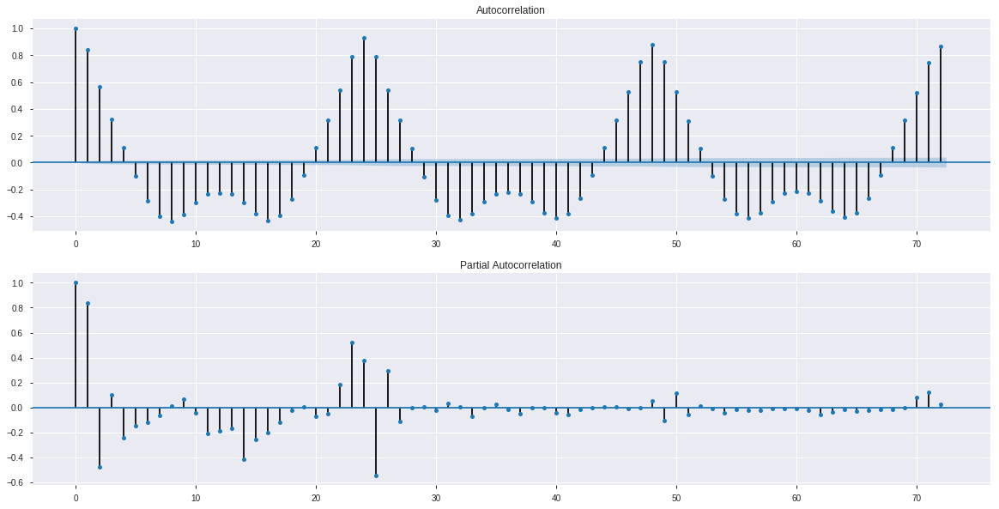

In [24]:
#we use tra.diff()(differenced data), because this time series is unit root process.
fig,ax = plt.subplots(2,1,figsize=(20,10))
fig = sm.graphics.tsa.plot_acf( train['demand_in_MW'].diff().dropna(), lags=72, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(train['demand_in_MW'].diff().dropna(), lags=72, ax=ax[1])
plt.show()

Of course, we have already exposed the weekly and yearly seasonal element during our exploratory data analysis. Checking for autocorrelation at lags ```168 (24 x 7, weekly)``` and ```8760 (24 x 365, yearly)```, respectively, would require a lot of memory. Instead, let's look at a model explicitly designed to account for multiple seasonalities.

<a id="9"></a> <br>
# Prophet

\begin{eqnarray}
\mbox{Forecasting Equation}: \\
y(t) & = & g(t) + s(t) + h(t) + εt \\
&& \\
\mbox{Where}: \\
g(t) & : & \mbox{piecewise linear or logistic growth curve for modelling non-periodic changes in time series} \\
s(t) & : & \mbox{periodic changes (e.g. weekly/yearly seasonality)} \\
h(t) & : & \mbox{effects of holidays (user provided) with irregular schedules} \\
εt & : & \mbox{error term accounts for any unusual changes not accommodated by the model} \\
\end{eqnarray}

Delve deeper into the math with [this article](https://medium.com/future-vision/the-math-of-prophet-46864fa9c55a).
<br>

An adept name for a model designed to predict time-series. It was developed by Facebook and [released as open source](https://github.com/facebook/prophet) in 2017.
It is distinct in the fact that it explicitly lets the user account for and configure seasonalities at multiple frequencies.

As the mathheads (not to be confused with methheads) amongst us surely know, we can do this by exploiting the nature of Fourier series: Breaking down a function of real numbers into a sum of sine waves. 
The Prophet documentation has [a section](https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#fourier-order-for-seasonalities) dedicated to fine-tuning the order of the fourier series for seasonalities. In summary:
* A **higher order** fits the sine wave more closely to the seasonality in the data, at the risk of capturing too much of the noise (overfitting).
* A **lower order** smoothes out the noise, at the risk of not capturing enough of the seasonality (underfitting).

A good, general fit lies in between. We will try to find this by employing Prophet's built-in cross-validation method.

If you want to learn more about Fourier series, do check out the amazing Grant Sanderson's "[But what is a Fourier series? From heat flow to circle drawings](https://www.youtube.com/watch?v=r6sGWTCMz2k)" on YouTube. Below is one of his many gorgeous visualisations, illustrating the additive concept of sine waves in the context of heat equations:
![3Brown1Blue](https://i.imgur.com/hu8hEpl.png)

In [25]:
# https://facebook.github.io/prophet/docs/quick_start.html#python-api
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation

In [26]:
# format data for prophet model using 'ds' and 'y'
train_prophet = train[['demand_in_MW']]\
                    .reset_index()\
                    .rename(columns={
                        'index':'ds', 
                        'demand_in_MW':'y'
                    })

test_prophet = test[['demand_in_MW']]\
                    .reset_index()\
                    .rename(columns={
                        'index':'ds',
                        'demand_in_MW':'y'
                    })

## Conditional Seasonalities
As stated in the [documentation](https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#seasonalities-that-depend-on-other-factors):
> In some instances the seasonality may depend on other factors, such as a weekly seasonal pattern that is different during the summer than it is during the rest of the year, or a daily seasonal pattern that is different on weekends vs. on weekdays. These types of seasonalities can be modeled using conditional seasonalities.

From our EDA, we could tell that the variance in the daily seasonality is higher in Winter and Summer. Not coincidentally, these are the seasons where the absolute difference in ambient temperature vs. desired temperature is greatest. Let's try to break down the patterns in our data to account for such interdependent variability.

In [27]:
# conditions
def is_spring(ds):
    date = pd.to_datetime(ds)
    return (date.month >= 3) & (date.month <= 5)

def is_summer(ds):
    date = pd.to_datetime(ds)
    return (date.month >= 6) & (date.month <= 8)

def is_autumn(ds):
    date = pd.to_datetime(ds)
    return (date.month >= 9) & (date.month <= 11)

def is_winter(ds):
    date = pd.to_datetime(ds)
    return (date.month >= 12) | (date.month <= 2)

def is_weekend(ds):
    date = pd.to_datetime(ds)
    return date.weekday_name in ('Saturday', 'Sunday')

# adding to train set
train_prophet['is_spring'] = train_prophet['ds'].apply(is_spring)
train_prophet['is_summer'] = train_prophet['ds'].apply(is_summer)
train_prophet['is_autumn'] = train_prophet['ds'].apply(is_autumn)
train_prophet['is_winter'] = train_prophet['ds'].apply(is_winter)
train_prophet['is_weekend'] = train_prophet['ds'].apply(is_weekend)
train_prophet['is_weekday'] = ~train_prophet['ds'].apply(is_weekend)

# adding to test set
test_prophet['is_spring'] = test_prophet['ds'].apply(is_spring)
test_prophet['is_summer'] = test_prophet['ds'].apply(is_summer)
test_prophet['is_autumn'] = test_prophet['ds'].apply(is_autumn)
test_prophet['is_winter'] = test_prophet['ds'].apply(is_winter)
test_prophet['is_weekend'] = test_prophet['ds'].apply(is_weekend)
test_prophet['is_weekday'] = ~test_prophet['ds'].apply(is_weekend)

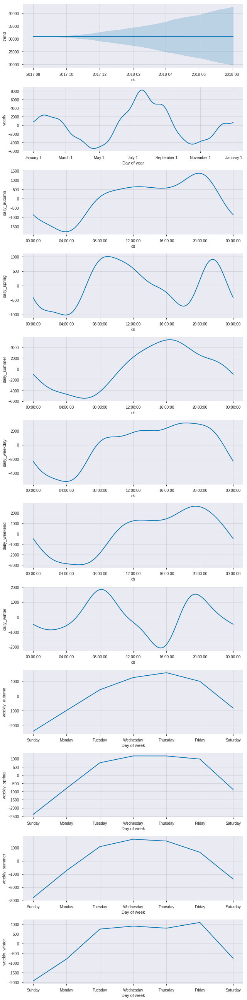

In [28]:
# instantiating the class with custom settings, for the sake of illustration
prophet = Prophet(
     daily_seasonality=False,
    weekly_seasonality=False,
    yearly_seasonality=False
)

# custom seasonalities to account for conditional variance 
# (more extreme trends in extreme seasons)
prophet.add_seasonality(name='yearly', period=365.25, fourier_order=10)
prophet.add_seasonality(name='weekly_spring', 
                        period=7,
                        fourier_order=5, 
                        condition_name='is_spring')
prophet.add_seasonality(name='weekly_summer', 
                        period=7,
                        fourier_order=5, 
                        condition_name='is_summer')
prophet.add_seasonality(name='weekly_autumn', 
                        period=7,
                        fourier_order=5, 
                        condition_name='is_autumn')
prophet.add_seasonality(name='weekly_winter', 
                        period=7,
                        fourier_order=5, 
                        condition_name='is_winter')
prophet.add_seasonality(name='daily_spring',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_spring')
prophet.add_seasonality(name='daily_summer',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_summer')
prophet.add_seasonality(name='daily_autumn',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_autumn')
prophet.add_seasonality(name='daily_winter',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_winter')
prophet.add_seasonality(name='daily_weekend',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_weekend')
prophet.add_seasonality(name='daily_weekday',  
                        period=1,
                        fourier_order=5, 
                        condition_name='is_weekday')

# account for holidays
#prophet.add_country_holidays(country_name='US')

# fitting the model
prophet.fit(train_prophet);

# part of the dataframe on which we want to make predictions
future = test_prophet.drop(['y'], axis=1)

# predicting values
forecast = prophet.predict(future)

# see https://github.com/facebook/prophet/issues/999 for the matplotlib_converts()
pd.plotting.register_matplotlib_converters()

# plotting the seasonality components found
_ = prophet.plot_components(forecast)

In [29]:
# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_prophet.ds, y=test_prophet.y,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=forecast.ds, y=forecast.yhat,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='Prophet Forecast of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

# quantify accuracy
print(f'MAPE for Prophet\'s predictions: {mape(test_prophet.y, forecast.yhat)}')

MAPE for Prophet's predictions: 9.25%


As before, let's zoom in on some intra-day predictions at the beginning and at the end of the forecasting period.

In [30]:
# interval length
interval = 24 * 7

# intermediary variables for readability
x_true, y_true = test_prophet.iloc[:interval].ds, test_prophet.iloc[:interval].y
x_pred, y_pred = forecast.iloc[:interval].ds, forecast.iloc[:interval].yhat

# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Prophet Intra-Day Forecast of First {interval} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

# quantify accuracy
print(f'MAPE for interval of the first {interval} hours: {mape(y_true, y_pred)}')

MAPE for interval of the first 168 hours: 9.47%


In [31]:
# interval length
interval = -24 * 7

# intermediary variables for readability
x_true, y_true = test_prophet.iloc[interval:].ds, test_prophet.iloc[interval:].y
x_pred, y_pred = forecast.iloc[interval:].ds, forecast.iloc[interval:].yhat

# create figure
fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

# adjust layout
fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Prophet Intra-Day Forecast of Last {abs(interval)} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

# quantify accuracy
print(f'MAPE for interval of the last {abs(interval)} hours: {mape(y_true, y_pred)}')

MAPE for interval of the last 168 hours: 7.14%


<a id="10"></a> <br>
# Conclusion 
* Holt-Winter seems to capture more of the erraticness, but mistakes it for being a trend. It is not immediately obvious how to fine tune it.
* Prophet, on the other hand, seems more consistent. It gives us much more insight and flexibility, offering a great baseline on which to improve.

Incorporating weather forecast data is the obvious next step towards improving our predictive performance.